In [1]:
import pickle
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TerminateOnNaN, CSVLogger
from tensorflow.keras import backend as K
import numpy as np
from matplotlib import pyplot as plt, patches
from sklearn.model_selection import train_test_split

from models.ssd_transfer_v2 import tl_build_model
from loss_function.custom_loss import AOILoss
from performance_metrics.metrics_classification import f1
from performance_metrics.metrics_regression import mae, mse
from custom_layers.GridCenters import GridCenters

from input_encoder_decoder.input_encoder_new import SSDInputEncoder
from input_encoder_decoder.output_decoder import decode_detections
from input_encoder_decoder.data_generator import DataGenerator

%matplotlib inline

2023-10-23 16:36:08.336105: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-10-23 16:36:08.336150: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-10-23 16:36:08.336176: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-10-23 16:36:08.342577: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Using TensorFlow backend


2023-10-23 16:36:11.253789: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-10-23 16:36:11.258302: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-10-23 16:36:11.258492: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [3]:
img_height = 256  # Height of the input images
img_width = 256  # Width of the input images
img_channels = 3  # Number of color channels of the input images
intensity_mean = 127.5  # Set this to your preference (maybe `None`). The current settings transform the input pixel values to the interval `[-1,1]`.
intensity_range = 127.5  # Set this to your preference (maybe `None`). The current settings transform the input pixel values to the interval `[-1,1]`.
n_classes = 1  # Number of positive classes
normalize_coords = True  # Whether or not the model is supposed to use coordinates relative to the image size
variant = "resnet"

In [4]:
K.clear_session()

model = tl_build_model(image_size=(img_height, img_width, img_channels),
                       n_classes=n_classes,
                       variant=variant,
                       l2_regularization=0.0005,
                       normalize_coords=normalize_coords)

aoi_loss = AOILoss(neg_pos_ratio=3, alpha=3.0)

model.compile(optimizer='Adam', loss=aoi_loss.compute_loss, metrics=[f1, mae, mse])

In [5]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 gaussian_noise (GaussianNo  (None, 256, 256, 3)          0         ['input_2[0][0]']             
 ise)                                                                                             
                                                                                                  
 efficient_net_v2_backbone   (None, None, None, 1280)     5919312   ['gaussian_noise[0][0]']      
 (EfficientNetV2Backbone)                                                                         
                                                                                              

In [6]:
predictor_size = [model.get_layer('conv_loc').output_shape[1:3]]
print('Predictor Layer Dimensions: ', predictor_size)

encoder = SSDInputEncoder(img_height,
                          img_width,
                          n_classes,
                          predictor_sizes=predictor_size,
                          normalize_coords=True,
                          background_id=0)

generator = DataGenerator(parent_dir='/home/kerem/AOI/Datasets/train_pcb_crops', encoder=encoder, augmentation=True,
                          probability=0.1)

X, y = generator.get_data()

Predictor Layer Dimensions:  [(8, 8)]
Generating image arrays and encoding labels...
Converting images to arrays...


100%|███████████████████████████████████| 15000/15000 [00:11<00:00, 1349.78it/s]


Images as numpy:
(15000, 256, 256, 3)
Parsing ground truth labels from .csv


100%|████████████████████████████████████| 15000/15000 [00:44<00:00, 338.43it/s]


Unencoded labels:
15000
Augmenting images and relabeling...
Applying randomized augmentation...


100%|██████████████████████████████████| 15000/15000 [00:00<00:00, 20682.95it/s]


Encoded labels:
(15000, 64, 12)


In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42)

print('Train dataset: ', X_train.shape)
print('Test dataset: ', X_test.shape)
print('Train labels: ', y_train.shape)
print('Test labels: ', y_test.shape)

Train dataset:  (12000, 256, 256, 3)
Test dataset:  (3000, 256, 256, 3)
Train labels:  (12000, 64, 12)
Test labels:  (3000, 64, 12)


In [8]:
model_checkpoint = ModelCheckpoint(
    filepath='checkpoints/ssd7_epoch-{epoch:02d}_loss-{loss:.4f}_val_loss-{val_loss:.4f}.h5',
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=False,
    mode='auto',
    save_freq="epoch")

csv_logger = CSVLogger(filename='ssd7_training_log.csv',
                       separator=',',
                       append=True)

early_stopping = EarlyStopping(monitor='val_loss',
                               min_delta=0.0,
                               patience=7,
                               verbose=1,
                               restore_best_weights=True)

reduce_learning_rate = ReduceLROnPlateau(monitor='val_loss',
                                         factor=0.2,
                                         patience=4,
                                         verbose=1,
                                         min_delta=0.001,
                                         cooldown=0,
                                         min_lr=1e-6)

callbacks = [  #model_checkpoint,
    #csv_logger,
    early_stopping,
    reduce_learning_rate]

In [9]:
batch_size = 16
initial_epoch = 0
final_epoch = 200
steps_per_epoch = 1000

history = model.fit(X_train,
                    y_train,
                    batch_size=batch_size,
                    #steps_per_epoch=steps_per_epoch,
                    epochs=final_epoch,
                    callbacks=callbacks,
                    validation_data=(X_test, y_test),
                    #validation_steps=ceil(X_test.shape[0]/batch_size),
                    initial_epoch=initial_epoch)

2023-10-21 14:36:14.552539: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 2359296000 exceeds 10% of free system memory.
2023-10-21 14:36:16.047487: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 2359296000 exceeds 10% of free system memory.


Epoch 1/200


2023-10-21 14:36:31.590438: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/efficient_net_v2_backbone/block2b_/block2b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2023-10-21 14:36:33.676793: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8700
2023-10-21 14:36:35.959561: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7f6c30a7a190 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-10-21 14:36:35.959583: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce GTX 1060, Compute Capability 6.1
2023-10-21 14:36:35.963769: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-10-21 14:36:36.044406: I ./tensorflow/compi

750/750 [==============================] - 194s 214ms/step - loss: 4.1555 - f1: 0.0473 - mae: 0.0877 - mse: 0.0493 - val_loss: 3.2277 - val_f1: 0.1826 - val_mae: 0.0500 - val_mse: 0.0125 - lr: 0.0010
Epoch 2/200
750/750 [==============================] - 156s 208ms/step - loss: 2.2480 - f1: 0.3265 - mae: 0.0427 - mse: 0.0097 - val_loss: 2.4046 - val_f1: 0.4595 - val_mae: 0.0376 - val_mse: 0.0086 - lr: 0.0010
Epoch 3/200
750/750 [==============================] - 157s 209ms/step - loss: 1.7861 - f1: 0.5369 - mae: 0.0348 - mse: 0.0083 - val_loss: 1.3255 - val_f1: 0.5901 - val_mae: 0.0325 - val_mse: 0.0074 - lr: 0.0010
Epoch 4/200
750/750 [==============================] - 157s 209ms/step - loss: 1.5771 - f1: 0.6288 - mae: 0.0306 - mse: 0.0066 - val_loss: 5.2329 - val_f1: 0.6533 - val_mae: 0.0302 - val_mse: 0.0086 - lr: 0.0010
Epoch 5/200
750/750 [==============================] - 157s 209ms/step - loss: 1.5078 - f1: 0.6690 - mae: 0.0300 - mse: 0.0107 - val_loss: 1.4462 - val_f1: 0.6873 -

In [10]:
model.save("efficientnetv2_b3_backbone_backbone_cnn")  #save with .keras ending

INFO:tensorflow:Assets written to: efficientnetv2_b3_backbone_backbone_cnn/assets


INFO:tensorflow:Assets written to: efficientnetv2_b3_backbone_backbone_cnn/assets


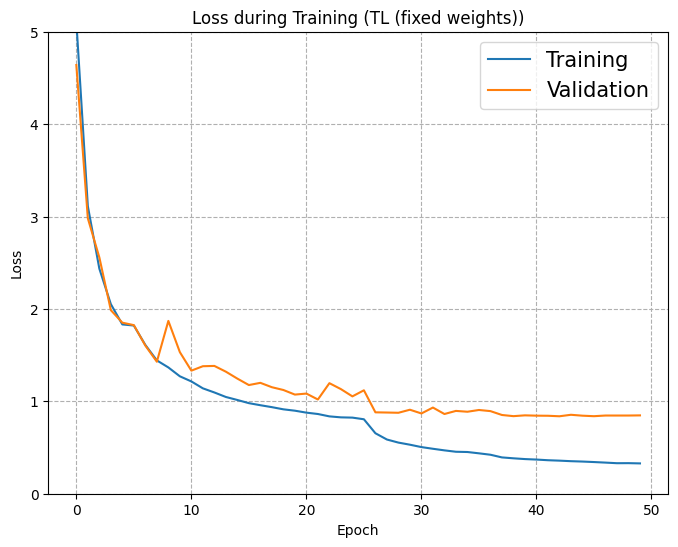

In [10]:
plt.figure(figsize=(8, 6))
plt.title("Loss during Training (TL (fixed weights))")
plt.grid(True, linestyle='--')
plt.plot(history.history['loss'], label='Training')
plt.plot(history.history['val_loss'], label='Validation')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.ylim(0, 5)
plt.legend(loc='upper right', prop={'size': 15});

plt.savefig("tl_locked_ssd_loss.png")

with open("tl_locked_ssd_loss.fig", "wb") as f:
    pickle.dump(plt.gcf(), f)

KeyError: 'class_mAP'

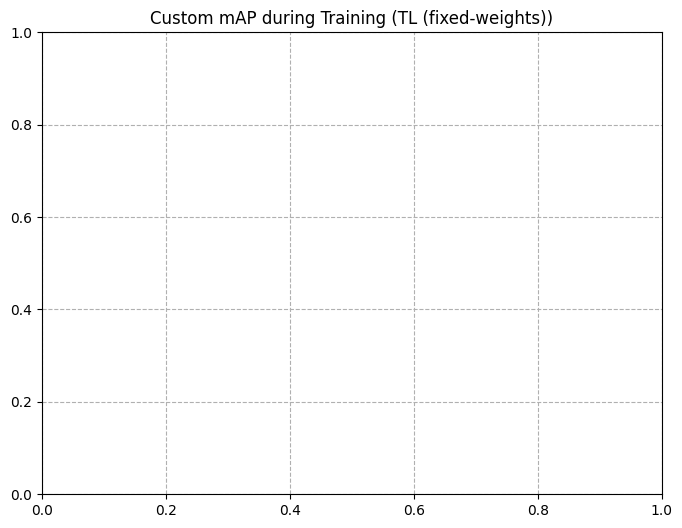

In [11]:
plt.figure(figsize=(8, 6))
plt.title("Custom mAP during Training (TL (fixed-weights))")
plt.grid(True, linestyle='--')
plt.plot(history.history['class_mAP'], label='Training')
plt.plot(history.history['val_class_mAP'], label='Validation')
plt.xlabel("Epoch")
plt.ylabel("Custom mAP")
plt.ylim(0, 1)
plt.legend(loc='lower right', prop={'size': 15});

plt.savefig("tl_locked_ssd_mAP.png")

with open("tl_locked_ssd_mAP.fig", "wb") as f:
    pickle.dump(plt.gcf(), f)

KeyError: 'offset_MAE'

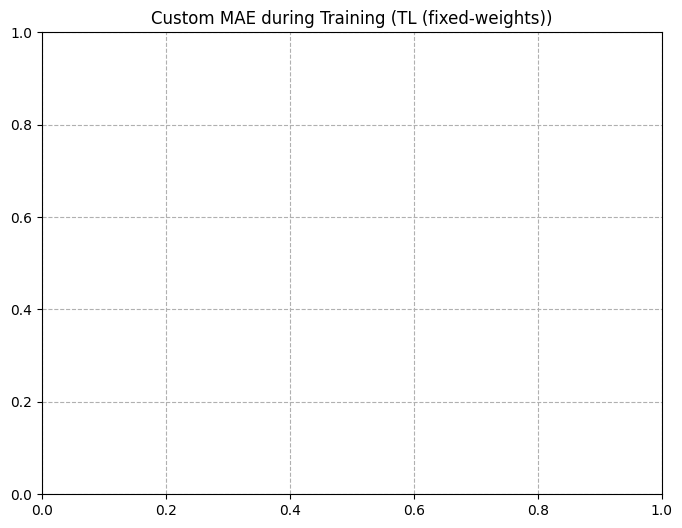

In [10]:
plt.figure(figsize=(8, 6))
plt.title("Custom MAE during Training (TL (fixed-weights))")
plt.grid(True, linestyle='--')
plt.plot(history.history['offset_MAE'], label='Training')
plt.plot(history.history['val_offset_MAE'], label='Validation')
plt.xlabel("Epoch")
plt.ylabel("Custom MAE")
plt.ylim(0, 0.15)
plt.legend(loc='upper right', prop={'size': 15});

plt.savefig("tl_locked_ssd_MAE.png")

with open("tl_locked_ssd_MAE.fig", "wb") as f:
    pickle.dump(plt.gcf(), f)

In [10]:
predictions = model.predict(X_test[:50])
print(predictions.shape)

2/2 [==============================] - 3s 923ms/step
(50, 64, 12)


In [11]:
decoded_pred = decode_detections(predictions, img_height=img_height, img_width=img_width)
print(decoded_pred[0])

[[  1.         1.       202.79604   29.208733 220.65158   33.0568
  199.08638   53.09689  216.95706   56.766495]
 [  1.         1.       159.68732  215.84317  183.60455  218.17586
  157.84944  234.68651  181.99821  237.16864 ]]


In [12]:
decoded_labels = decode_detections(y_test[:50], img_height=img_height, img_width=img_width)
print(decoded_labels[0])

[[  1.   1. 203.  30. 221.  33. 199.  52. 217.  55.]
 [  1.   1. 159. 218. 182. 219. 158. 235. 180. 236.]]


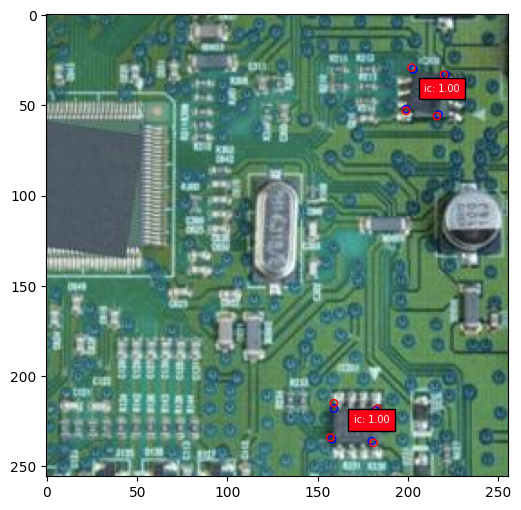

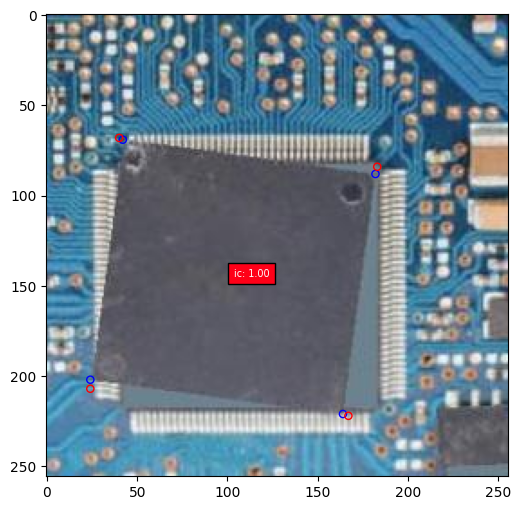

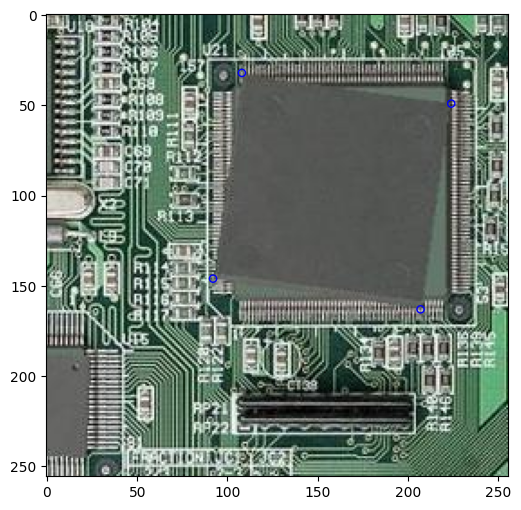

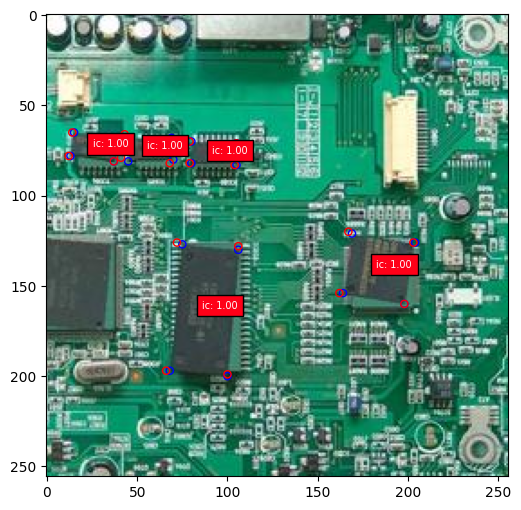

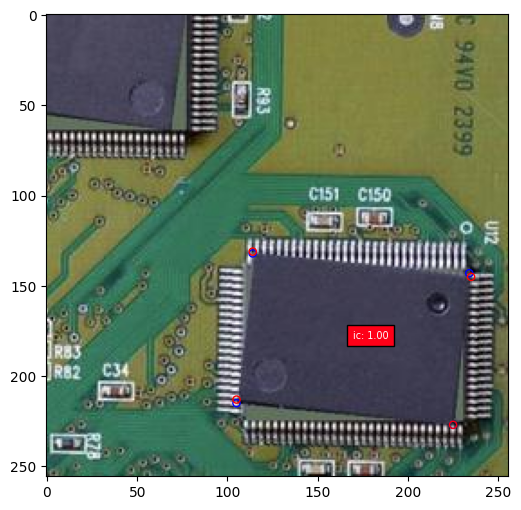

...

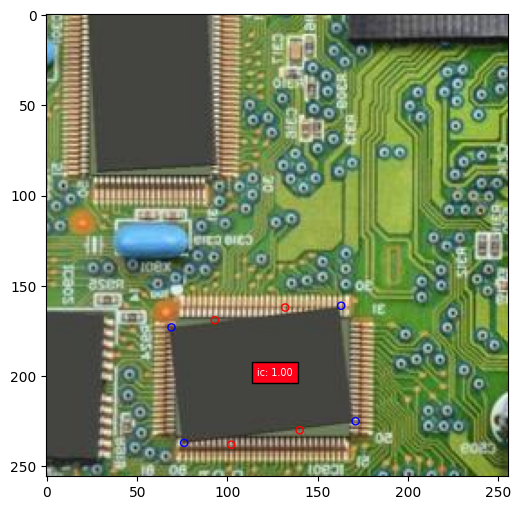

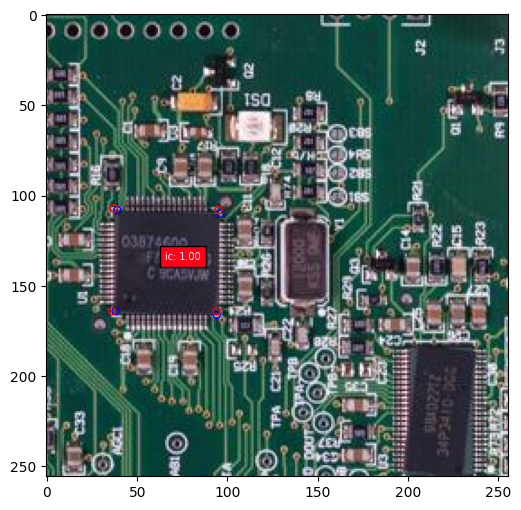

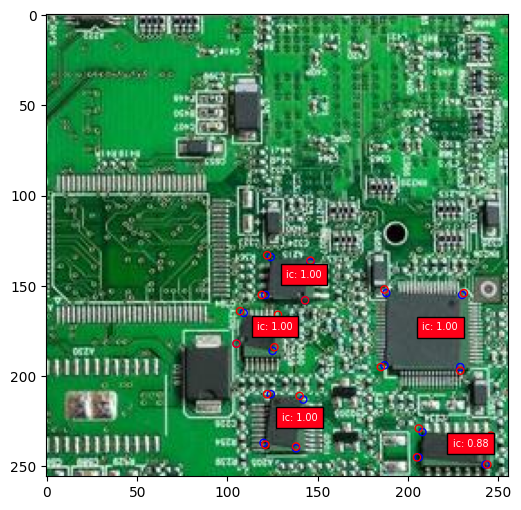

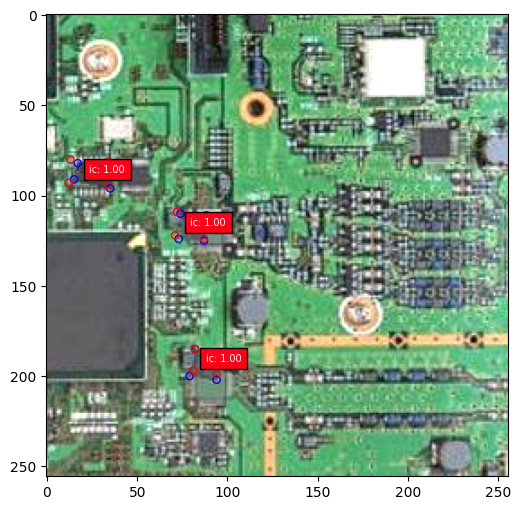

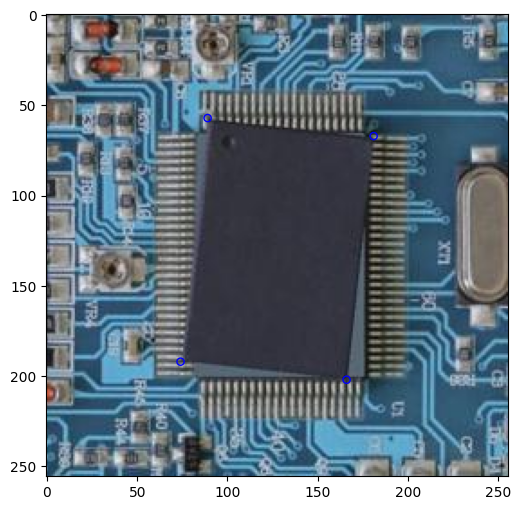

In [13]:
for i in range(len(decoded_pred[:20])):
    plt.figure(figsize=(10, 6))
    plt.imshow(X_test[i])
    current_axis = plt.gca()

    colors = plt.cm.hsv(np.linspace(0, 1, n_classes + 1)).tolist()  # Set the colors for the bounding boxes
    classes = ['background', 'ic']  # Just so we can print class names onto the image instead of IDs

    for label in decoded_labels[i]:
        pred = np.array(label)
        corners = np.reshape(pred[2:], (-1, 2)).astype(int)
        color = colors[int(pred[0])]
        label = '{}'.format(classes[int(pred[0])])
        for points in corners:
            current_axis.add_patch(plt.Circle(tuple(points), 2, fill=False, color='blue'))

    for label in decoded_pred[i]:
        pred = np.array(label)
        corners = np.reshape(pred[2:], (-1, 2)).astype(int)
        color = colors[int(pred[0])]
        label = '{}: {:.2f}'.format(classes[int(pred[0])], pred[1])
        for points in corners:
            current_axis.add_patch(plt.Circle(tuple(points), 2, fill=False, color='red'))
        center_x = (corners[0, 0] + corners[3, 0]) / 2
        center_y = (corners[0, 1] + corners[3, 1]) / 2
        current_axis.text(center_x, center_y, label, size='x-small', color='white',
                          bbox={'facecolor': color, 'alpha': 1.0})


In [ ]:
#model.save("model_realistic_pcb_ssd6_conv6_256_15000_relu_noise")